<a href="https://colab.research.google.com/github/jrebull/Vision/blob/main/Team_13_MNA_Vision_5_4_Fourier.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 🎓 Maestría en Inteligencia Artificial Aplicada

<center>

[![Institution](https://img.shields.io/badge/Institution-Tecnológico%20de%20Monterrey-1F497D?style=for-the-badge&logo=graduation-cap)](https://tec.mx)
[![Course](https://img.shields.io/badge/Course-Computer%20Vision-FF6B6B?style=for-the-badge&logo=eye)](https://tec.mx)
[![Activity](https://img.shields.io/badge/Activity%205.4-Google%20Colab-F9AB00?style=for-the-badge&logo=googlecolab)](https://colab.research.google.com)

</center>

---

## 🖼️ **Visión Computacional para Imágenes y Video**

### 👨‍🏫 **Profesores**
- **Profesor Titular:** Dr. Gilberto Ochoa Ruiz
- **Profesor Asistente:** MIP Ma. del Refugio Melendez Alfaro
- **Profesor Tutor:** M. en C. Jose Angel Martinez Navarro

---

## 📊 **Actividad: Algoritmos de Mejoramiento de imágenes en el dominio de Fourier**

### 📌 **Detalles de la Actividad**
- **Código:** 5.4 Google Colab
- **Título:** Algoritmos de mejoramiento de mejoramiento de imágenes en el dominio de Fourier
- **Fecha de entrega:** 📅 Octubre 12, 2025 a las 23:59
- **Formato de entrega:** ZIP
- **Modalidad:** Equipo

---

## 👥 **Team 13**

### 🚀 **Nuestro Equipo**

<table style="width:100%; border:none;">
<tr>
<td style="text-align:center; border:none; padding:20px;">

### **Javier Augusto Rebull Saucedo**
<img src="https://iili.io/KuvsGKx.png" alt="Javier Augusto Rebull Saucedo" width="150">

**Matrícula:** `A01795838`  
🎓 MNA Student

</td>
<td style="text-align:center; border:none; padding:20px;">

### **Juan Carlos Pérez Nava**
<img src="https://iili.io/KuvP4gp.png" alt="Juan Carlos Pérez Nava" width="150">

**Matrícula:** `A01795941`  
🎓 MNA Student

</td>
</tr>
<tr>
<td style="text-align:center; border:none; padding:20px;">

### **Luis Gerardo Sánchez Salazar**
<img src="https://iili.io/KuvLaJp.png" alt="Luis Gerardo Sánchez Salazar" width="150">

**Matrícula:** `A01232963`  
🎓 MNA Student

</td>
<td style="text-align:center; border:none; padding:20px;">

### **Oscar Enrique García García**
<img src="https://iili.io/KuvQx24.png" alt="Oscar Enrique García García" width="150">

**Matrícula:** `A01016093`  
🎓 MNA Student

</td>
</tr>
</table>

---

## 🎯 **Objetivo del Proyecto**

En esta sesión profundizaremos en el estudio de las **técnicas de mejoramiento de imágenes usando operaciones morfológicas en el dominio espacial**. Los temas discutidos de forma teórica en la clase previa serán abordados aquí de forma práctica usando Google Colab, implementando aplicaciones reales de erosión, dilatación, opening y closing.

En esta sesión profundizaremos en el estudio de las **técnicas de mejoramiento de imágenes usando técnicas basadas en Fourier en el dominio de la frecuencia.**

---

## 🔗 **Repositorio del Proyecto**

# 5. Dominio de Frecuencia

## Tabla de Contenidos
1. Bibliotecas
2. Transformada Rápida de Fourier (FFT
3. Filtro Pasa Baja - low
4. Filtro Pasa alta - high

## Importando librerias <a class="anchor" id="libraries" ></a>

In [27]:
# ===============================================================
# INSTALACIÓN DE LIBRERÍAS
# ===============================================================
!pip install -q pydicom pillow-heif opencv-python-headless
!pip install rawpy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 49.1 MB/s eta 0:00:00


In [28]:
# ===============================================================
# MANEJO DE DATOS Y COMPUTACIÓN CIENTÍFICA
# ===============================================================
import numpy as np       # Arreglos multidimensionales y operaciones matemáticas
import rawpy

# ===============================================================
# UTILIDADES Y MANEJO DEL SISTEMA
# ===============================================================
import os             # Operaciones del sistema operativo
import shutil         # Limpieza de Archivos
import gdown          # Descarga de archivos desde Google Drive


# ===============================================================
# PROCESAMIENTO DE IMÁGENES
# ===============================================================
import cv2                          # OpenCV para manipulación y filtros avanzados de imágenes

# ===============================================================
# VISUALIZACIÓN DE DATOS
# ===============================================================
import matplotlib.pyplot as plt     # Creación de gráficos y visualizaciones


# ===============================================================
# FUNCIONES MATEMÁTICAS
# ===============================================================
from math import sqrt, exp          # sqrt: raíz cuadrada, exp: exponencial


from urllib.request import urlopen          # Para solicitudes HTTP básicas
from datetime import datetime               # Manejo de fechas y horas
from zoneinfo import ZoneInfo               # Manejo de zonas horarias
import time                                 # Calcular Tiempo de Ejecución

# ===============================================================
# MENSAJE DE CONFIRMACIÓN
# ===============================================================
print("✅ Librerías cargadas y listas para la Visión")
print(f"📅 Timestamp de ejecución: {datetime.now(ZoneInfo('America/Mexico_City')).strftime('%Y-%m-%d %H:%M:%S')}")

try:
    with urlopen('https://ipapi.co/country_name/') as response:
        country = response.read().decode('utf-8').strip()
    print(f"🌍 País de ejecución: {country}")
    with urlopen('https://ipapi.co/region/') as response:
        region = response.read().decode('utf-8').strip()
    print(f"🗺️ Estado/Región de ejecución: {region}")
except Exception as e:
    print("No se pudo determinar el país o estado de ejecución (posiblemente sin conexión a internet).")

notebook_start_time = time.time()

✅ Librerías cargadas y listas para la Visión
📅 Timestamp de ejecución: 2025-10-09 10:17:22
🌍 País de ejecución: United States
🗺️ Estado/Región de ejecución: Washington, D.C.


In [29]:
# ===============================================================
#  PARTE 1: LIMPIEZA INICIAL
# ===============================================================
print("\n--- Limpiando archivos en las carpetas especificadas ---")
directorios_a_limpiar = ["data", "imagenes_nuevas"]

for directorio in directorios_a_limpiar:
    if os.path.exists(directorio):
        print(f"Eliminando contenido de la carpeta '{directorio}'...")
        for filename in os.listdir(directorio):
            file_path = os.path.join(directorio, filename)
            try:
                if os.path.isfile(file_path) or os.path.islink(file_path):
                    os.unlink(file_path)  # Eliminar archivo o enlace simbólico
                elif os.path.isdir(file_path):
                    shutil.rmtree(file_path)  # Eliminar subcarpetas
            except Exception as e:
                print(f"Error al eliminar {file_path}: {e}")
        print(f"Carpeta '{directorio}' limpiada.")
    else:
        print(f"La carpeta '{directorio}' no existe, no requiere limpieza.")

# ===============================================================
#  PARTE 2: DESCARGA DE LA IMAGEN DEMO
# ===============================================================

print("\n--- Iniciando la descarga de la imagen demo ---")

# --- 1. Preparar el directorio de salida para la imagen demo ---
output_dir_demo = "data"
if not os.path.exists(output_dir_demo):
    os.makedirs(output_dir_demo)
    print(f"Carpeta '{output_dir_demo}' creada.")

# --- 2. Definir la imagen demo a descargar ---
file_id_demo = "1lCrQws3c835E5LCp438TkPwJV0ULQ1GD"
filename_demo = "image.jpg"
output_path_demo = os.path.join(output_dir_demo, filename_demo)

# --- 3. Descargar la imagen demo ---
print(f"Descargando '{filename_demo}' en '{output_dir_demo}'...")
gdown.download(id=file_id_demo, output=output_path_demo, quiet=False)


# ===============================================================
#  PARTE 2: DESCARGA DE IMAGENES en BATCH
# ===============================================================

# --- 1. Preparar el directorio de salida original ---
output_dir_original = "imagenes_nuevas"
if not os.path.exists(output_dir_original):
    os.makedirs(output_dir_original)
    print(f"Carpeta '{output_dir_original}' creada.")

# --- 2. Definir las imágenes a descargar ---
imagenes_a_descargar = {
    "01 - Sapporo.jpeg": "1QPLZiWvoeqHhPGC0zpCn1Ur1RepmdcIA",
    "02 - Hokkaido.jpeg": "15JJTBPXKJXMG2IA630vtsH68HtrJ7TJr",
    "03 - Islas.jpeg": "16SDTVaSMnjE-TKjgRWiK-cz1tzBkcPtx",
    "04 - Disney.jpeg": "1y-m8mW8hEnByS7QsSVi9Z6XkwHyRKsNT",
    "05 - Galaxy_edge.jpeg": "1qS_IvloDbJvxlB6Z5OO4BAORmW5cgaJY",
    "06 - Minato.jpeg": "1Ed80fSpTg9HmSEASOisDAjJAEGX26Yph",
    "07 - Manizales.png": "1BRp-qJ3zBjIf9MT2MZmNZMY1VN1R3Ovv",
    "08 - OXXO.png" : "1fvtksd5gXPDicnkCMPWNaVn23NL9eUlc"
}

print("\n--- Iniciando la descarga de la lista de imágenes ---")

# --- 3. Bucle para descargar cada imagen de la lista ---
for filename, file_id in imagenes_a_descargar.items():
    output_path = os.path.join(output_dir_original, filename)
    print(f"Descargando '{filename}'...")
    gdown.download(id=file_id, output=output_path, quiet=False)

print("\n✅ ¡Descarga de la lista completada!")



--- Limpiando archivos en las carpetas especificadas ---
Eliminando contenido de la carpeta 'data'...
Carpeta 'data' limpiada.
Eliminando contenido de la carpeta 'imagenes_nuevas'...
Carpeta 'imagenes_nuevas' limpiada.

--- Iniciando la descarga de la imagen demo ---
Descargando 'image.jpg' en 'data'...


Downloading...
From: https://drive.google.com/uc?id=1lCrQws3c835E5LCp438TkPwJV0ULQ1GD
To: /content/data/image.jpg
100%|██████████| 105k/105k [00:00<00:00, 5.00MB/s]



--- Iniciando la descarga de la lista de imágenes ---
Descargando '01 - Sapporo.jpeg'...


Downloading...
From: https://drive.google.com/uc?id=1QPLZiWvoeqHhPGC0zpCn1Ur1RepmdcIA
To: /content/imagenes_nuevas/01 - Sapporo.jpeg
100%|██████████| 3.75M/3.75M [00:00<00:00, 94.0MB/s]


Descargando '02 - Hokkaido.jpeg'...


Downloading...
From: https://drive.google.com/uc?id=15JJTBPXKJXMG2IA630vtsH68HtrJ7TJr
To: /content/imagenes_nuevas/02 - Hokkaido.jpeg
100%|██████████| 2.37M/2.37M [00:00<00:00, 54.1MB/s]


Descargando '03 - Islas.jpeg'...


Downloading...
From: https://drive.google.com/uc?id=16SDTVaSMnjE-TKjgRWiK-cz1tzBkcPtx
To: /content/imagenes_nuevas/03 - Islas.jpeg
100%|██████████| 5.16M/5.16M [00:00<00:00, 45.4MB/s]


Descargando '04 - Disney.jpeg'...


Downloading...
From: https://drive.google.com/uc?id=1y-m8mW8hEnByS7QsSVi9Z6XkwHyRKsNT
To: /content/imagenes_nuevas/04 - Disney.jpeg
100%|██████████| 480k/480k [00:00<00:00, 12.8MB/s]


Descargando '05 - Galaxy_edge.jpeg'...


Downloading...
From: https://drive.google.com/uc?id=1qS_IvloDbJvxlB6Z5OO4BAORmW5cgaJY
To: /content/imagenes_nuevas/05 - Galaxy_edge.jpeg
100%|██████████| 990k/990k [00:00<00:00, 9.04MB/s]


Descargando '06 - Minato.jpeg'...


Downloading...
From: https://drive.google.com/uc?id=1Ed80fSpTg9HmSEASOisDAjJAEGX26Yph
To: /content/imagenes_nuevas/06 - Minato.jpeg
100%|██████████| 2.37M/2.37M [00:00<00:00, 66.8MB/s]


Descargando '07 - Manizales.png'...


Downloading...
From: https://drive.google.com/uc?id=1BRp-qJ3zBjIf9MT2MZmNZMY1VN1R3Ovv
To: /content/imagenes_nuevas/07 - Manizales.png
100%|██████████| 1.30M/1.30M [00:00<00:00, 42.8MB/s]


Descargando '08 - OXXO.png'...


Downloading...
From: https://drive.google.com/uc?id=1fvtksd5gXPDicnkCMPWNaVn23NL9eUlc
To: /content/imagenes_nuevas/08 - OXXO.png
100%|██████████| 1.27M/1.27M [00:00<00:00, 24.3MB/s]


✅ ¡Descarga de la lista completada!


In [30]:
# ===================================================================
#  PARTE 3: PROCESAMIENTO Y REDIMENSIÓN DE IMÁGENES
# ===================================================================
print("\n" + "="*60)
print("🚀 Iniciando procesamiento para redimensionar imágenes...")
print("="*60)

# --- Función de redimensionamiento (sin cambios) ---
def resize_image(img, max_width=800):
    """Redimensiona la imagen manteniendo la proporción de aspecto."""
    height, width = img.shape[:2]
    if width > max_width:
        ratio = max_width / float(width)
        new_height = int(height * ratio)
        return cv2.resize(img, (max_width, new_height), interpolation=cv2.INTER_AREA)
    return img

# --- Estructura para almacenar los resultados ---
# Usamos un diccionario para guardar las imágenes redimensionadas y sus nombres.
resultados = {
    "data": {"imagenes_redimensionadas": [], "nombres": []},
    "imagenes_nuevas": {"imagenes_redimensionadas": [], "nombres": []}
}

# --- Bucle principal de procesamiento ---
directorios_a_procesar = ["data", "imagenes_nuevas"]

for directorio in directorios_a_procesar:
    print(f"\n📂 Procesando directorio: '{directorio}'...")

    try:
        archivos = [f for f in os.listdir(directorio)
                   if f.lower().endswith(('.jpg', '.jpeg', '.png', '.dng', '.heic', '.heif'))]

        for nombre_archivo in archivos:
            ruta_completa = os.path.join(directorio, nombre_archivo)
            img = None

            # --- Lectura de la imagen (con soporte para RAW y HEIC) ---
            try:
                if nombre_archivo.lower().endswith('.dng'):
                    with rawpy.imread(ruta_completa) as raw:
                        rgb_array = raw.postprocess()
                        img = cv2.cvtColor(rgb_array, cv2.COLOR_RGB2BGR)
                elif nombre_archivo.lower().endswith(('.heic', '.heif')):
                    heif_file = pillow_heif.read_heif(ruta_completa)
                    image_pil = Image.frombytes(heif_file.mode, heif_file.size, heif_file.data, "raw")
                    img = cv2.cvtColor(np.array(image_pil), cv2.COLOR_RGB2BGR)
                else:
                    img = cv2.imread(ruta_completa)
            except Exception as e:
                print(f"  ⚠️ Error leyendo '{nombre_archivo}': {e}")
                continue # Pasa al siguiente archivo

            # --- Si la imagen se leyó correctamente, se redimensiona ---
            if img is not None:
                print(f"  - Redimensionando: {nombre_archivo}")
                img_redimensionada = resize_image(img, max_width=800)

                # --- Guardar en la estructura de resultados ---
                resultados[directorio]["imagenes_redimensionadas"].append(img_redimensionada)
                resultados[directorio]["nombres"].append(nombre_archivo)
            else:
                print(f"  ❌ No se pudo decodificar la imagen: {nombre_archivo}")

    except FileNotFoundError:
        print(f"  ❌ Error: El directorio '{directorio}' no fue encontrado.")
    except Exception as e:
        print(f"  ❌ Error inesperado procesando '{directorio}': {e}")

# --- Resumen final ---
print("\n" + "="*60)
print("✅ ¡PROCESAMIENTO DE REDIMENSIÓN COMPLETADO!")
print("="*60)
total_imagenes = 0
for directorio, data in resultados.items():
    cantidad = len(data['imagenes_redimensionadas'])
    print(f"📁 {directorio}: {cantidad} imágenes redimensionadas.")
    total_imagenes += cantidad
print("="*60)
print(f"📊 TOTAL: {total_imagenes} imágenes procesadas.")
print("="*60)


🚀 Iniciando procesamiento para redimensionar imágenes...

📂 Procesando directorio: 'data'...
  - Redimensionando: image.jpg

📂 Procesando directorio: 'imagenes_nuevas'...
  - Redimensionando: 03 - Islas.jpeg
  - Redimensionando: 08 - OXXO.png
  - Redimensionando: 07 - Manizales.png
  - Redimensionando: 01 - Sapporo.jpeg
  - Redimensionando: 05 - Galaxy_edge.jpeg
  - Redimensionando: 02 - Hokkaido.jpeg
  - Redimensionando: 06 - Minato.jpeg
  - Redimensionando: 04 - Disney.jpeg

✅ ¡PROCESAMIENTO DE REDIMENSIÓN COMPLETADO!
📁 data: 1 imágenes redimensionadas.
📁 imagenes_nuevas: 8 imágenes redimensionadas.
📊 TOTAL: 9 imágenes procesadas.


## Transformada Rápida de Fourier (FFT) <a class="anchor" id="fft" ></a>

La **Transformada Rápida de Fourier (FFT)** permite convertir una imagen desde su dominio espacial (donde cada valor representa la intensidad de un píxel en coordenadas $x, y$) al dominio de frecuencia, donde se representan las variaciones espaciales en términos de componentes senoidales.

Esta transformación facilita el análisis y la manipulación de las frecuencias espaciales que componen la imagen:

- **Las frecuencias bajas** corresponden a variaciones suaves o zonas homogéneas, como gradientes o áreas sin bordes definidos.
- **Las frecuencias altas** representan cambios abruptos, como bordes, texturas finas o detalles estructurales.

Trabajar en el dominio de frecuencia permite aplicar filtros específicos (como paso bajos o paso altos) para resaltar, atenuar o eliminar ciertas características visuales, lo cual es útil en tareas como compresión, mejora de contraste, eliminación de ruido o detección de bordes.

Las siguientes funciones implementan el proceso de transformación al dominio de frecuencia mediante la Transformada Rápida de Fourier (FFT):

- `np.fft.fft2(...)` - Aplica la Transformada de Fourier bidimensional a la imagen. El resultado es una matriz de números complejos que representa el espectro de frecuencia, donde cada componente codifica una frecuencia espacial presente en la imagen.
- `np.fft.fftshift(...)` - Reorganiza el espectro de frecuencia para que las frecuencias bajas (incluido el componente DC) se ubiquen en el centro de la imagen. Esta disposición facilita el análisis visual y la aplicación de filtros espaciales, ya que es más intuitiva y simétrica.
- `np.fft.ifftshift(...)` - Realiza la operación inversa de fftshift, desplazando las frecuencias bajas nuevamente hacia las esquinas. Esto es necesario para preparar el espectro antes de aplicar la Transformada Inversa de Fourier. Visualmente, el resultado ("Decentralized") es equivalente al espectro original ("Spectrum").
- `np.fft.ifft2(...)` - Aplica la Transformada Inversa de Fourier 2D, reconstruyendo la imagen en el dominio espacial a partir de su espectro de frecuencia. El resultado es una matriz de píxeles que representa la imagen procesada.
- `np.abs(...)` - Dado que la salida de la FFT contiene valores complejos, se calcula su magnitud (o módulo) para obtener una representación visual interpretable del espectro.
- `np.log(1 + ...)` - El espectro de magnitud suele tener un rango dinámico muy amplio, donde las frecuencias bajas dominan en intensidad. Aplicar una escala logarítmica permite comprimir ese rango, haciendo visibles los detalles de frecuencia alta (bordes, texturas). El término +1 evita errores numéricos al calcular $log(0)$.


# Demo Image - Fast Fourier Transform (FFT)

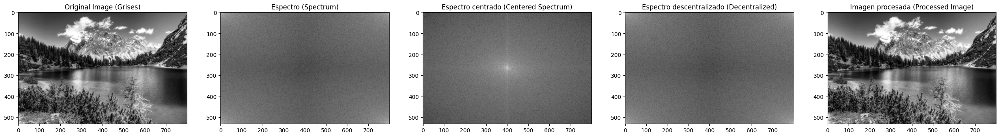

In [61]:
# --- 1. Obtener la imagen redimensionada de la variable 'resultados' ---
# Accedemos a la imagen de la carpeta 'data'.
img_redimensionada_color = resultados["data"]["imagenes_redimensionadas"][0]

# --- 2. Convertirla a escala de grises para el análisis ---
# La Transformada de Fourier se aplica sobre un solo canal (escala de grises).
img = cv2.cvtColor(img_redimensionada_color, cv2.COLOR_BGR2GRAY)

# Crea una figura grande para mostrar las 5 imágenes del proceso.
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

# Muestra la imagen redimensionada y en grises en la primera posición.
plt.subplot(151), plt.imshow(img, "gray"), plt.title("Original Image (Grises)")

# Calcula la Transformada Rápida de Fourier 2D.
original = np.fft.fft2(img)
# Muestra el espectro de magnitud.
plt.subplot(152), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Espectro (Spectrum)")

# Mueve el componente de frecuencia cero al centro para visualizarlo mejor.
center = np.fft.fftshift(original)
# Muestra el espectro centrado.
plt.subplot(153), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Espectro centrado (Centered Spectrum)")

# Invierte el centrado para poder reconstruir la imagen.
inv_center = np.fft.ifftshift(center)
# Muestra el espectro descentralizado.
plt.subplot(154), plt.imshow(np.log(1+np.abs(inv_center)), "gray"), plt.title("Espectro descentralizado (Decentralized)")

# Calcula la Transformada Inversa para obtener la imagen de vuelta.
processed_img = np.fft.ifft2(inv_center)
# Muestra la imagen procesada final.
plt.subplot(155), plt.imshow(np.abs(processed_img), "gray"), plt.title("Imagen procesada (Processed Image)")

# Muestra la ventana con todos los gráficos.
plt.show()

# Batch of Images - Fast Fourier Transform (FFT)

--- 🖼️  Procesando imagen: 03 - Islas.jpeg ---


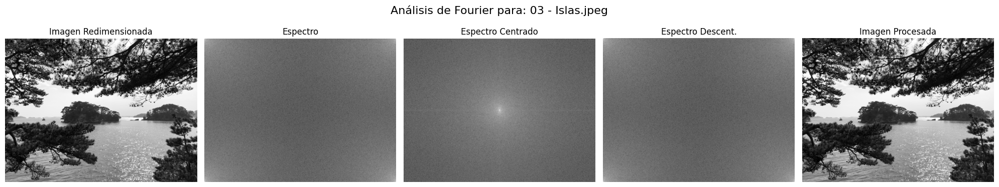



--- 🖼️  Procesando imagen: 08 - OXXO.png ---


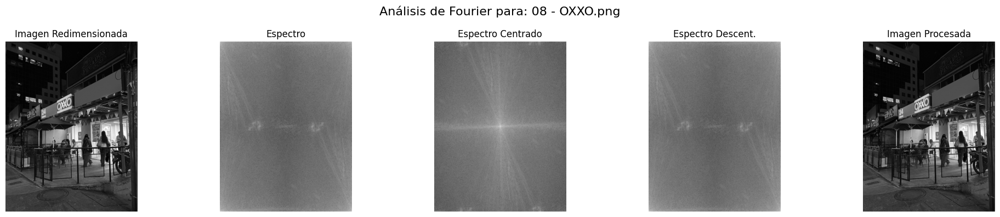



--- 🖼️  Procesando imagen: 07 - Manizales.png ---


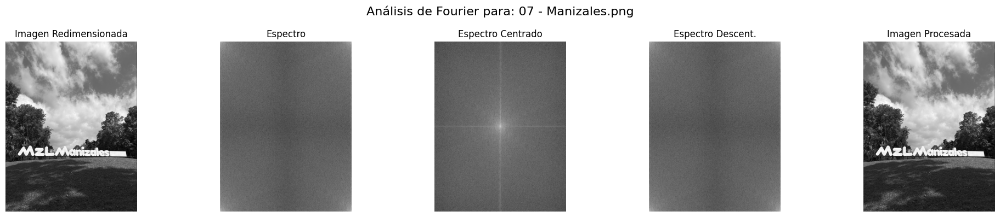



--- 🖼️  Procesando imagen: 01 - Sapporo.jpeg ---


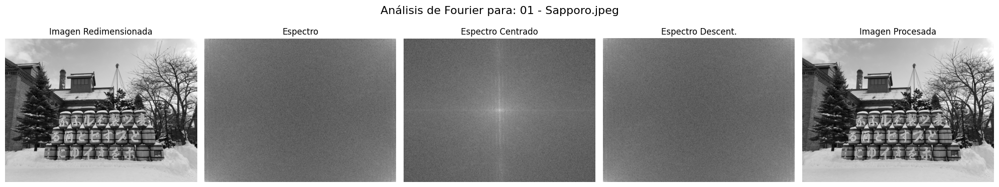



--- 🖼️  Procesando imagen: 05 - Galaxy_edge.jpeg ---


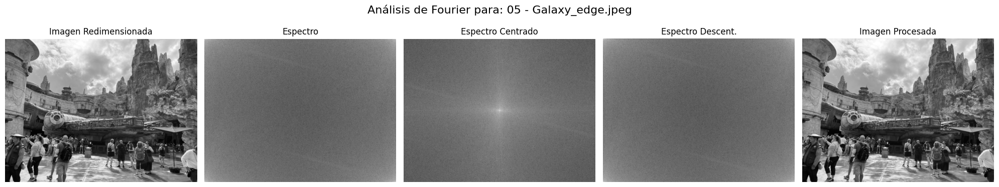



--- 🖼️  Procesando imagen: 02 - Hokkaido.jpeg ---


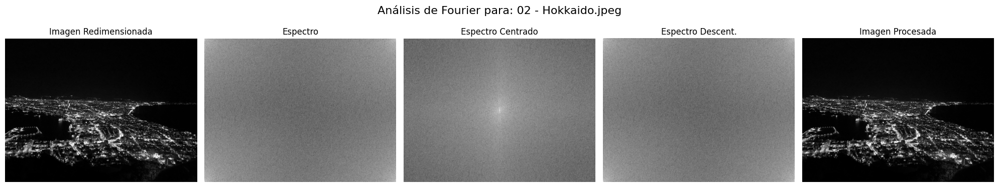



--- 🖼️  Procesando imagen: 06 - Minato.jpeg ---


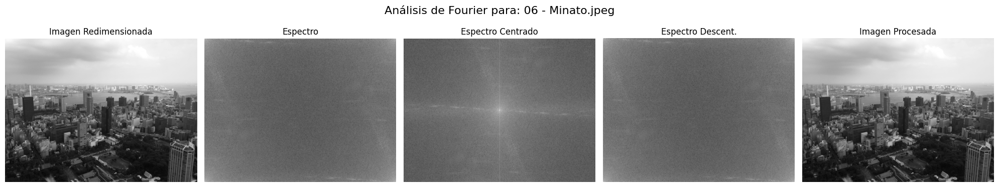



--- 🖼️  Procesando imagen: 04 - Disney.jpeg ---


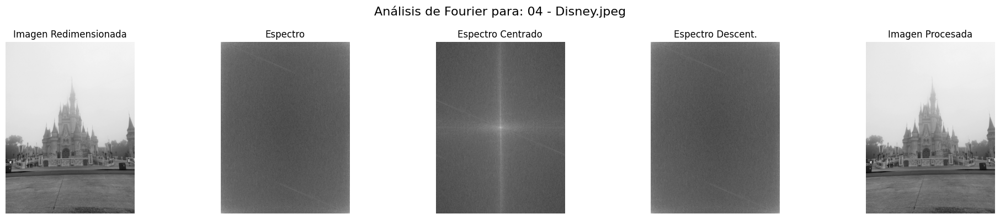




✅ ¡Procesamiento de todas las imágenes completado!


In [54]:
# Itera sobre cada imagen y su nombre en la lista de 'imagenes_nuevas'
for nombre, img_redimensionada_color in zip(resultados["imagenes_nuevas"]["nombres"],
                                            resultados["imagenes_nuevas"]["imagenes_redimensionadas"]):
    print(f"--- 🖼️  Procesando imagen: {nombre} ---")

    # 1. Convierte la imagen a escala de grises
    img = cv2.cvtColor(img_redimensionada_color, cv2.COLOR_BGR2GRAY)

    # 2. Crea la figura
    fig, axes = plt.subplots(1, 5, figsize=(20, 4))
    fig.suptitle(f"Análisis de Fourier para: {nombre}", fontsize=16)

    # 3. Dibuja todos los subplots
    axes[0].imshow(img, cmap="gray")
    axes[0].set_title("Imagen Redimensionada")
    axes[0].axis('off')

    original = np.fft.fft2(img)
    axes[1].imshow(np.log(1+np.abs(original)), cmap="gray")
    axes[1].set_title("Espectro")
    axes[1].axis('off')

    center = np.fft.fftshift(original)
    axes[2].imshow(np.log(1+np.abs(center)), cmap="gray")
    axes[2].set_title("Espectro Centrado")
    axes[2].axis('off')

    inv_center = np.fft.ifftshift(center)
    axes[3].imshow(np.log(1+np.abs(inv_center)), cmap="gray")
    axes[3].set_title("Espectro Descent.")
    axes[3].axis('off')

    processed_img = np.fft.ifft2(inv_center)
    axes[4].imshow(np.abs(processed_img), cmap="gray")
    axes[4].set_title("Imagen Procesada")
    axes[4].axis('off')

    # Tight_layout automático
    plt.tight_layout()

    plt.show()
    print("\n")

print("\n✅ ¡Procesamiento de todas las imágenes completado!")

# Demo Image Análisis de Fourier: Espectro de Magnitud y Fase

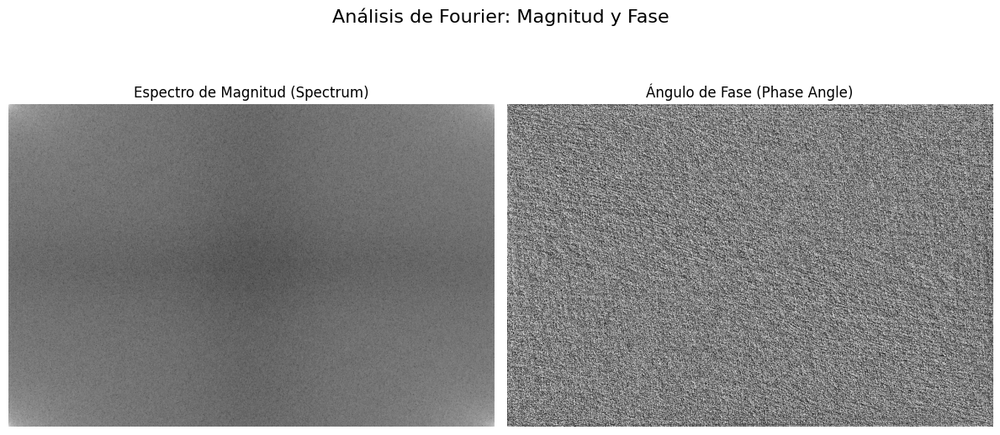

In [58]:
# --- 1. Preparar la figura ---
# Se crea una figura para mostrar 2 imágenes. Ajustamos el tamaño.
fig, axes = plt.subplots(1, 2, figsize=(12, 6))
fig.suptitle("Análisis de Fourier: Magnitud y Fase", fontsize=16)

# --- 2. Cargar la imagen demo ---
# Se lee la imagen 'image.jpg' de la carpeta 'data' en escala de grises.
img = cv2.imread("data/image.jpg", 0)

# --- 3. Calcular la Transformada de Fourier ---
# Se calcula la FFT 2D de la imagen. El resultado es un arreglo de números complejos.
original = np.fft.fft2(img)

# --- 4. Visualizar la Magnitud ---
# Se muestra el espectro de magnitud (qué tan intensas son las frecuencias).
# Usamos np.log(1+...) para mejorar la visualización de los detalles.
axes[0].imshow(np.log(1+np.abs(original)), cmap="gray")
axes[0].set_title("Espectro de Magnitud (Spectrum)")
axes[0].axis('off')

# --- 5. Visualizar la Fase ---
# Se muestra el ángulo de fase (dónde se localizan las frecuencias).
axes[1].imshow(np.angle(original), cmap="gray")
axes[1].set_title("Ángulo de Fase (Phase Angle)")
axes[1].axis('off')

# --- 6. Mostrar el resultado ---
plt.tight_layout()
plt.show()

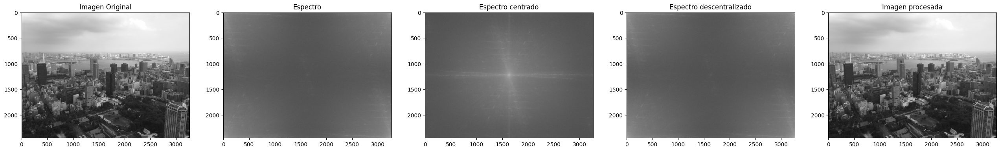

In [34]:
image_path = os.path.join(output_dir_original, "06 - Minato.jpeg")

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

img = cv2.imread("imagenes_nuevas/06 - Minato.jpeg", 0)
plt.subplot(151), plt.imshow(img, "gray"), plt.title("Imagen Original")

original = np.fft.fft2(img)
plt.subplot(152), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Espectro")

center = np.fft.fftshift(original)
plt.subplot(153), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Espectro centrado")

inv_center = np.fft.ifftshift(center)
plt.subplot(154), plt.imshow(np.log(1+np.abs(inv_center)), "gray"), plt.title("Espectro descentralizado")

processed_img = np.fft.ifft2(inv_center)
plt.subplot(155), plt.imshow(np.abs(processed_img), "gray"), plt.title("Imagen procesada")

plt.show()

Este código realiza una visualización básica del espectro de frecuencia de una imagen utilizando la Transformada Rápida de Fourier (FFT). A continuación se describen las funciones clave utilizadas en el proceso:

- `np.fft.fft2(...)` - Aplica la Transformada de Fourier bidimensional a la imagen. El resultado es una matriz de números complejos que representa el espectro de frecuencia, donde cada componente codifica una frecuencia espacial presente en la imagen.
frecuencia.

- `np.abs(...)` - Calcula la magnitud del espectro, descartando la información de fase. Esto permite obtener una representación visual interpretable de la intensidad de cada frecuencia.


- `np.log(...)` - Aplica una escala logarítmica para comprimir el rango dinámico del espectro de magnitud.


- `np.angle(...)` - Extrae el ángulo de fase de cada componente complejo. Esta fase representa el desplazamiento espacial de cada frecuencia y permite analizar cómo se distribuyen las estructuras en la imagen original.




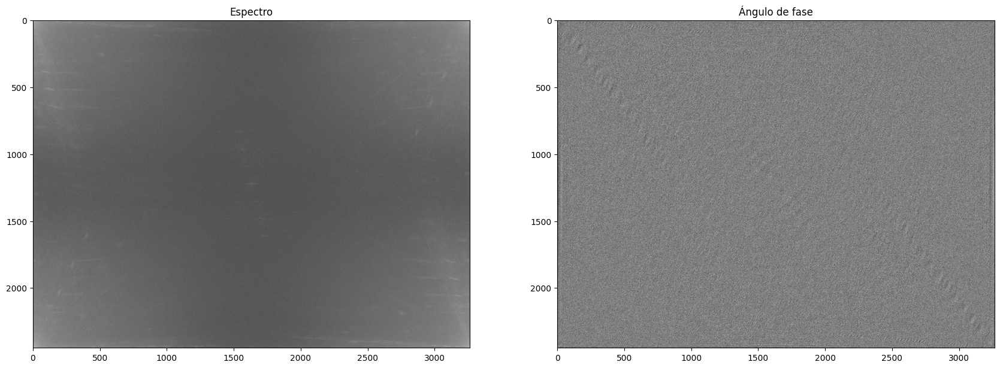

In [5]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

img = cv2.imread(image_path, 0)

original = np.fft.fft2(img)
plt.subplot(131), plt.imshow(np.log(np.abs(original)), "gray"), plt.title("Espectro")

plt.subplot(132), plt.imshow(np.angle(original), "gray"), plt.title("Ángulo de fase")
plt.show()

El siguiente conjunto de funciones define máscaras de filtrado en el dominio de frecuencia para imágenes, utilizando distintos modelos de filtros pasabajas (LP) y filtros pasaalta (HP). Estas máscaras se aplican sobre el espectro de frecuencia de una imagen transformada mediante FFT, permitiendo modificar su contenido espectral de forma controlada.

- `distance(point1,point2)` - Calcula la distancia euclidiana entre dos puntos en coordenadas (x, y). Se utiliza para determinar qué tan lejos está cada punto del centro del espectro, lo cual es clave para construir máscaras radiales.

- `idealFilterLP(D0,imgShape) `- Genera una máscara de filtro pasabajas ideal
  - `D0` es el radio de corte.
  - Las frecuencias dentro del radio se conservan (valor 1), y las que están fuera se eliminan (valor 0).
  - La máscara tiene forma circular centrada en el espectro.
  - Suprime bordes y detalles finos (frecuencias altas), produciendo un efecto de suavizado.

- `idealFilterHP(D0,imgShape)` - Genera una máscara de filtro pasaalta ideal:
  - Es el complemento del filtro pasabajas ideal.
  - Las frecuencias dentro del radio D0 se eliminan (valor 0), y las externas se conservan (valor 1).
  - Resalta bordes y texturas, eliminando zonas suaves.

- `butterworthLP(D0,imgShape,n)` - Genera una máscara pasabajas Butterworth:
  - `D0`: frecuencia de corte.
  - `n`: orden del filtro, que controla la suavidad de la transición.
  - A diferencia del filtro ideal, la atenuación es gradual, evitando bordes abruptos en el espectro.

- `butterworthHP(D0,imgShape,n)` - Genera una máscara pasaalta Butterworth:
  - Conserva las frecuencias altas con una transición suave.
  - Ideal para resaltar detalles sin introducir artefactos bruscos.

- `gaussianLP(D0,imgShape)` - Genera una máscara pasabajas gaussiana:
  - Utiliza una función gaussiana centrada en el espectro.
  - La atenuación es suave y continua, sin bordes definidos.
  - Muy útil para aplicar desenfoque controlado sin artefactos.


- `gaussianHP(D0,imgShape)` - Genera una máscara pasaalta gaussiana:
  - Es el complemento del filtro gaussiano pasabajas.
  - Atenúa las frecuencias bajas suavemente, conservando bordes y texturas.




In [6]:
def distance(point1,point2):
    return sqrt((point1[0]-point2[0])**2 + (point1[1]-point2[1])**2)

def idealFilterLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 1
    return base

def idealFilterHP(D0,imgShape):
    base = np.ones(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            if distance((y,x),center) < D0:
                base[y,x] = 0
    return base

def butterworthLP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

def butterworthHP(D0,imgShape,n):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1-1/(1+(distance((y,x),center)/D0)**(2*n))
    return base

def gaussianLP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

def gaussianHP(D0,imgShape):
    base = np.zeros(imgShape[:2])
    rows, cols = imgShape[:2]
    center = (rows/2,cols/2)
    for x in range(cols):
        for y in range(rows):
            base[y,x] = 1 - exp(((-distance((y,x),center)**2)/(2*(D0**2))))
    return base

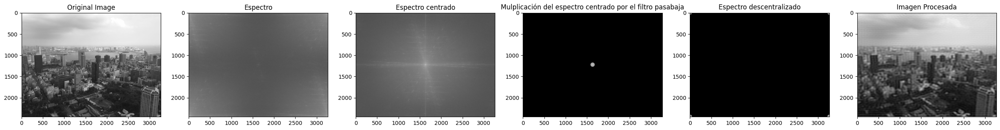

In [7]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

img = cv2.imread(image_path, 0)
plt.subplot(161), plt.imshow(img, "gray"), plt.title("Original Image")

original = np.fft.fft2(img)
plt.subplot(162), plt.imshow(np.log(1+np.abs(original)), "gray"), plt.title("Espectro")

center = np.fft.fftshift(original)
plt.subplot(163), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Espectro centrado")

LowPassCenter = center * idealFilterLP(50,img.shape)
plt.subplot(164), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Mulplicación del espectro centrado por el filtro pasabaja")

LowPass = np.fft.ifftshift(LowPassCenter)
plt.subplot(165), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Espectro descentralizado")

inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(166), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Imagen Procesada")

plt.show()

## Filtro pasa baja <a class="anchor" id="low" ></a>

Un filtro pasabajas es una herramienta que permite el paso de las frecuencias bajas y bloquea o atenúa las frecuencias altas. En procesamiento de imágenes, esto produce un efecto de suavizado o desenfoque, ya que se eliminan los detalles finos como bordes y texturas, conservando las zonas homogéneas o graduales.

El siguiente código realiza una demostración completa del proceso de filtrado pasabajas en el dominio de frecuencia usando la Transformada Rápida de Fourier (FFT).

- `np.fft.fft2(...)` - Aplica la Transformada Rápida de Fourier bidimensional (FFT) a una imagen. Convierte la imagen del dominio espacial (píxeles) al dominio de frecuencia, generando una matriz de números complejos que representa las frecuencias espaciales presentes en la imagen.

- `np.fft.fftshift(...)` - Reorganiza el espectro de frecuencia generado por `fft2` para que las frecuencias bajas (zonas suaves, componente DC) se ubiquen en el centro de la matriz. Esto facilita el análisis visual y la aplicación de máscaras centradas, como los filtros pasabajas

- `LowPass = idealFilterLP(50,img.shape)`
  - Genera una máscara de filtro pasabajas ideal con un radio de corte D0 = 50
  - Las frecuencias dentro del radio se conservan (valor 1).
  - Las frecuencias fuera del radio se eliminan (valor 0).
  - La máscara tiene forma circular centrada y se adapta al tamaño de la imagen (img.shape).

- `LowPassCenter = center * idealFilterLP(50,img.shape)` - Multiplica el espectro de frecuencia centrado (center) por la máscara pasabajas.
Esto filtra el espectro, eliminando las frecuencias altas y conservando las bajas.
El resultado es un espectro modificado que contiene solo las componentes suaves de la imagen.

- `LowPass = np.fft.ifftshift(LowPassCenter)`
Aplica la operación inversa de fftshift, descentrando el espectro filtrado.
Este paso es necesario para preparar el espectro antes de aplicar la transformada inversa, ya que `ifft2` espera las frecuencias bajas en las esquinas.

- `inverse_LowPass = np.fft.ifft2(LowPass)`
Aplica la Transformada Inversa de Fourier 2D al espectro filtrado.
Convierte el espectro de vuelta al dominio espacial, reconstruyendo una imagen suavizada, donde los detalles finos han sido eliminados por el filtro pasabajas.

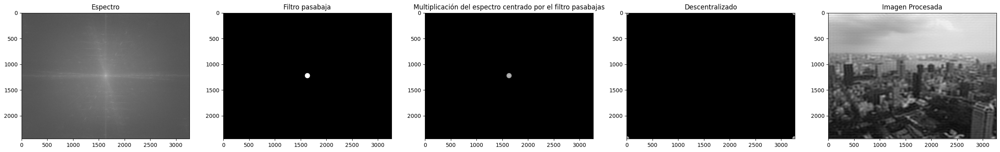

In [8]:
img = cv2.imread(image_path, 0)
original = np.fft.fft2(img)
center = np.fft.fftshift(original)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(151), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Espectro")

LowPass = idealFilterLP(50,img.shape)
plt.subplot(152), plt.imshow(np.abs(LowPass), "gray"), plt.title("Filtro pasabaja")

LowPassCenter = center * idealFilterLP(50,img.shape)
plt.subplot(153), plt.imshow(np.log(1+np.abs(LowPassCenter)), "gray"), plt.title("Multiplicación del espectro centrado por el filtro pasabajas")

LowPass = np.fft.ifftshift(LowPassCenter)
plt.subplot(154), plt.imshow(np.log(1+np.abs(LowPass)), "gray"), plt.title("Descentralizado")

inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(155), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Imagen Procesada")

plt.show()

## Filtro pasa alta  <a class="anchor" id="high" ></a>

Un filtro pasa alta es una herramienta que permite el paso de las frecuencias altas mientras bloquea o atenúa las frecuencias bajas. En procesamiento de imágenes, esto se traduce en un realce de bordes y detalles finos, ya que elimina las zonas suaves o homogéneas (como gradientes o áreas desenfocadas) y conserva las variaciones abruptas, como contornos, texturas y estructuras.

En el dominio de frecuencia:
- Las frecuencias bajas representan cambios suaves en la imagen, como el brillo general o zonas uniformes.
- Las frecuencias altas corresponden a cambios rápidos, como bordes, ruido y detalles finos.

Aplicar un filtro pasa alta es útil para:
- Detección de bordes
- Mejora del contraste local
- Preparación para segmentación o análisis estructural

`original = np.fft.fft2(img)` - Convierte la imagen al dominio de la frecuencia mediante la transformada de Fourier.

`center = np.fft.fftshift(original)` - Centra el espectro, desplazando las bajas frecuencias al centro de la imagen.

`HighPass = idealFilterHP(50,img.shape)`
- Genera un filtro pasa alta ideal con radio de corte 50.
- Este filtro elimina las bajas frecuencias (zonas suaves) y conserva los bordes y detalles.

`HighPassCenter = center * idealFilterHP(50,img.shape)`
- Multiplica el espectro centrado por el filtro pasa alta.
- Esto atenúa las bajas frecuencias y resalta las altas, como bordes y texturas.

`HighPass = np.fft.ifftshift(HighPassCenter)`
- Aplica ifftshift para descentrar el espectro antes de la transformada inversa.

`inverse_HighPass = np.fft.ifft2(HighPass)`
- Aplica la transformada inversa (ifft2) para volver al dominio espacial.
- El resultado es una imagen con bordes y detalles realzados, gracias al filtrado en frecuencia.

Este tipo de procesamiento es especialmente útil en tareas como detección de bordes, realce de detalles y análisis de texturas, donde la información de alta frecuencia es clave.



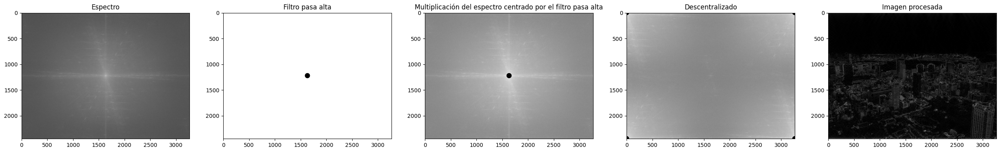

In [9]:
img = cv2.imread(image_path, 0)
original = np.fft.fft2(img)
center = np.fft.fftshift(original)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(151), plt.imshow(np.log(1+np.abs(center)), "gray"), plt.title("Espectro")

HighPass = idealFilterHP(50,img.shape)
plt.subplot(152), plt.imshow(np.abs(HighPass), "gray"), plt.title("Filtro pasa alta")

HighPassCenter = center * idealFilterHP(50,img.shape)
plt.subplot(153), plt.imshow(np.log(1+np.abs(HighPassCenter)), "gray"), plt.title("Multiplicación del espectro centrado por el filtro pasa alta")

HighPass = np.fft.ifftshift(HighPassCenter)
plt.subplot(154), plt.imshow(np.log(1+np.abs(HighPass)), "gray"), plt.title("Descentralizado")

inverse_HighPass = np.fft.ifft2(HighPass)
plt.subplot(155), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Imagen procesada")

plt.show()

En procesamiento de imágenes, los filtros en el dominio de la frecuencia permiten modificar el contenido espectral de una imagen para resaltar o atenuar ciertas características. Los filtros ideales son una forma sencilla y directa de seleccionar qué frecuencias conservar:

- `idealFilterLP(50, img.shape)` genera un filtro pasa baja ideal con radio de corte 50. Este filtro conserva las frecuencias bajas (representadas como un círculo blanco en el centro del espectro) y elimina las altas. Al aplicarlo, se suaviza la imagen, reduciendo bordes y detalles finos

- `idealFilterHP(50, img.shape)` genera el complemento del anterior: un filtro pasa alta ideal. Este bloquea las frecuencias bajas (el centro del espectro aparece como un anillo negro) y permite el paso de las altas, lo que produce una imagen con bordes, texturas y detalles más marcados.

Estos filtros son útiles para tareas como realce de bordes, reducción de ruido, segmentación y análisis estructural, dependiendo de si se desea enfatizar o suavizar los detalles de la imagen.


<div style="display: flex; justify-content: center; margin-top: 20px;">
  <table border="1" cellpadding="8" cellspacing="0" style="border-collapse: collapse; text-align: left;">
    <thead style="background-color: #f2f2f2;">
      <tr>
        <th>Tipo de filtro</th>
        <th>Qué conserva</th>
        <th>Qué elimina</th>
        <th>Efecto visual</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <td>Pasa baja (Low Pass)</td>
        <td>Zonas suaves</td>
        <td>Bordes y detalles</td>
        <td>Imagen más borrosa</td>
      </tr>
      <tr>
        <td>Pasa alta (High Pass)</td>
        <td>Bordes y texturas</td>
        <td>Zonas homogéneas</td>
        <td>Imagen más nítida</td>
      </tr>
    </tbody>
  </table>
</div>

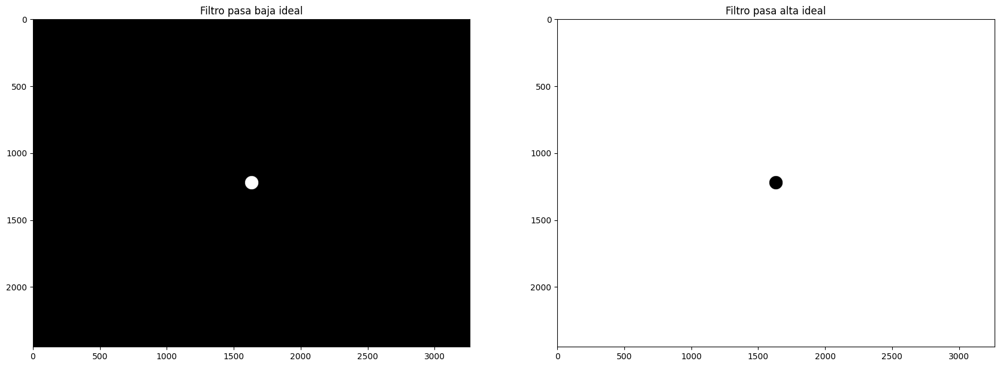

In [10]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

LowPass = idealFilterLP(50,img.shape)
plt.subplot(131), plt.imshow(LowPass, "gray"), plt.title("Filtro pasa baja ideal")

HighPass = idealFilterHP(50,img.shape)
plt.subplot(132), plt.imshow(HighPass, "gray"), plt.title("Filtro pasa alta ideal")

plt.show()

La fórmula del filtro Butterworth incorpora un parámetro denominado orden n, el cual determina la pendiente de la transición entre las frecuencias que se conservan y las que se atenúan. Cuando el valor de n es bajo, la transición es suave y gradual. En cambio, un valor alto, como n = 20, genera una caída más pronunciada, acercándose al comportamiento de un filtro ideal.

La funcion `butterworthLP(50, img.shape, 20)` genera un filtro pasa baja Butterworth con un radio de corte de 50, lo que define la frecuencia límite a partir de la cual comienza la atenuación. El orden 20 implica una transición muy marcada entre las frecuencias bajas y altas. Este filtro permite el paso de las frecuencias bajas y atenúa progresivamente las altas. Visualmente, se representa como un círculo blanco difuso en el centro del espectro sobre un fondo gris oscuro. Al aplicarlo a una imagen, se obtiene un efecto de suavizado, reduciendo bordes y detalles finos.

Por otro lado, `butterworthHP(50, img.shape, 20)` genera el complemento del anterior: un filtro pasa alta Butterworth. Este bloquea las frecuencias bajas y permite el paso gradual de las altas. En el espectro, se visualiza como un anillo blanco difuso que rodea un centro oscuro. Al aplicarlo, se realzan los bordes, las texturas y los detalles finos, sin introducir artefactos abruptos como los que pueden aparecer con filtros de corte más agresivo.

<div style="display: flex; justify-content: center; margin-top: 20px;">
  <table border="1" cellpadding="8" cellspacing="0" style="border-collapse: collapse; text-align: left; background-color: #ffffff;">
    <thead style="background-color: #f2f2f2;">
      <tr>
        <th>Tipo de filtro</th>
        <th>Transición</th>
        <th>Artefactos</th>
        <th>Aplicación típica</th>
      </tr>
    </thead>
    <tbody>
      <tr>
        <td>Ideal</td>
        <td>Abrupta</td>
        <td>Ringing</td>
        <td>Análisis teórico, pruebas</td>
      </tr>
      <tr>
        <td>Butterworth (n alto)</td>
        <td>Suave</td>
        <td>Mínimos</td>
        <td>Procesamiento práctico, realce controlado</td>
      </tr>
    </tbody>
  </table>
</div>


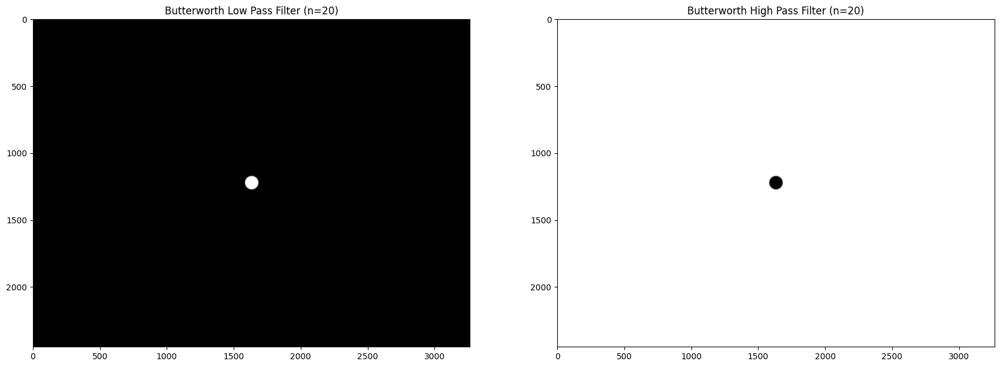

In [11]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

LowPass = butterworthLP(50,img.shape,20)
plt.subplot(131), plt.imshow(LowPass, "gray"), plt.title("Butterworth Low Pass Filter (n=20)")

HighPass = butterworthHP(50,img.shape,20)
plt.subplot(132), plt.imshow(HighPass, "gray"), plt.title("Butterworth High Pass Filter (n=20)")

plt.show()

Cuando se utiliza un filtro Butterworth con un orden muy bajo, la transición entre las frecuencias que se conservan y las que se atenúan se vuelve extremadamente suave. En lugar de tener un corte definido, el filtro actúa como una pendiente gradual que difumina la frontera entre lo que se permite y lo que se bloquea.

En el caso de un filtro pasa baja, esto significa que las frecuencias altas no se eliminan por completo, sino que se atenúan progresivamente. El resultado es una imagen con un efecto de suavizado más tenue, donde los bordes y detalles finos aún pueden estar parcialmente presentes. Visualmente, el espectro del filtro se verá como un degradado suave desde el centro hacia los bordes, sin un límite claro.

Para un filtro pasa alta, un orden bajo implica que las frecuencias bajas no se bloquean de forma abrupta, sino que se desvanecen gradualmente. Esto produce una imagen donde los bordes y texturas se realzan con menos agresividad, manteniendo parte del contenido suave original. El espectro se visualizará como un anillo difuso, con una transición suave entre el centro oscuro y el borde claro.

Este comportamiento es útil cuando se desea evitar artefactos como el ringing o preservar cierta naturalidad en la imagen, especialmente en aplicaciones donde el realce debe ser sutil o progresivo.


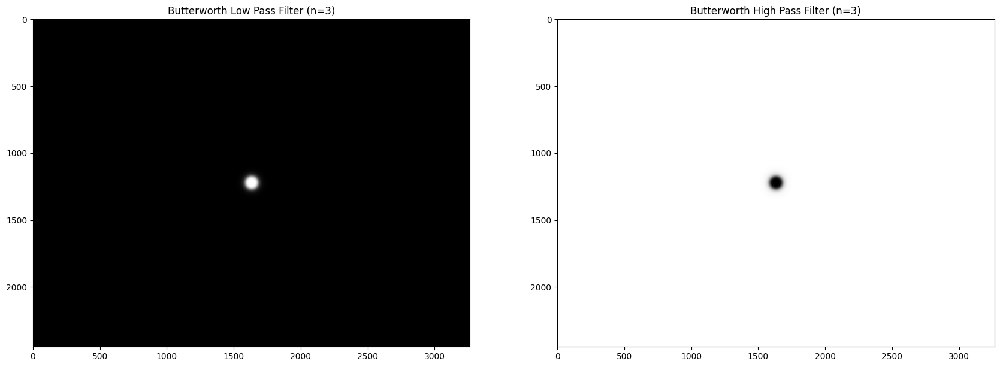

In [12]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

LowPass = butterworthLP(50,img.shape,3)
plt.subplot(131), plt.imshow(LowPass, "gray"), plt.title("Butterworth Low Pass Filter (n=3)")

HighPass = butterworthHP(50,img.shape,3)
plt.subplot(132), plt.imshow(HighPass, "gray"), plt.title("Butterworth High Pass Filter (n=3)")

plt.show()

Los filtros Gaussianos son ampliamente utilizados en procesamiento de imágenes debido a su suavidad, estabilidad y comportamiento matemáticamente continuo. A diferencia de los filtros ideales o Butterworth, el filtro Gaussiano no presenta un borde definido ni requiere un parámetro de orden. Su transición entre frecuencias es naturalmente progresiva, siguiendo la forma de la función gaussiana, lo que permite una atenuación gradual sin cortes abruptos.

Este tipo de filtro minimiza la aparición de artefactos como el ringing y genera resultados visualmente agradables, tanto en aplicaciones de suavizado como en tareas de realce.

La función `gaussianLP(50, img.shape)` genera un filtro pasa baja Gaussiano con un radio de corte de $50$. En este contexto, el radio determina el ancho de la campana gaussiana en el espectro de frecuencias. Las frecuencias bajas, ubicadas cerca del centro del espectro, se conservan con mayor intensidad, mientras que las altas se atenúan progresivamente según la forma de la curva.

Visualmente, el filtro aparece como un círculo blanco difuso en el centro, con una transición suave hacia el negro en los bordes. Al aplicarlo sobre una imagen, se obtiene un efecto de suavizado natural, reduciendo bordes y detalles finos sin introducir discontinuidades.

Por su parte, la función `gaussianHP(50, img.shape)` genera el complemento del anterior: un filtro pasa alta Gaussiano. Este atenúa las frecuencias bajas y conserva las altas, manteniendo también una transición gradual. En el espectro, se representa como un anillo blanco difuso que rodea un centro oscuro. Al aplicarlo, se realzan bordes, texturas y detalles finos de forma progresiva, sin generar artefactos abruptos. Este enfoque resulta especialmente útil en tareas que requieren un realce controlado y estéticamente limpio.

En resumen, los filtros Gaussianos se distinguen por su capacidad de producir resultados suaves y estables, sin necesidad de parámetros adicionales como el orden en los Butterworth, y con un comportamiento menos agresivo que el de los filtros ideales.

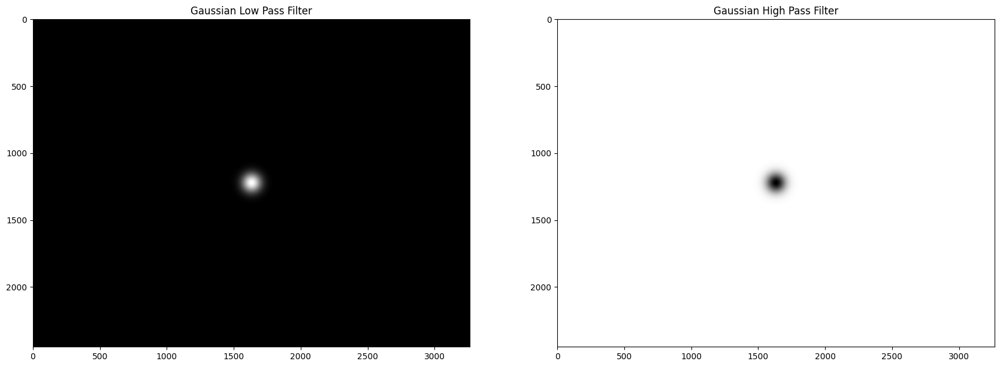

In [13]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

LowPass = gaussianLP(50,img.shape)
plt.subplot(131), plt.imshow(LowPass, "gray"), plt.title("Gaussian Low Pass Filter")

HighPass = gaussianHP(50,img.shape)
plt.subplot(132), plt.imshow(HighPass, "gray"), plt.title("Gaussian High Pass Filter")

plt.show()

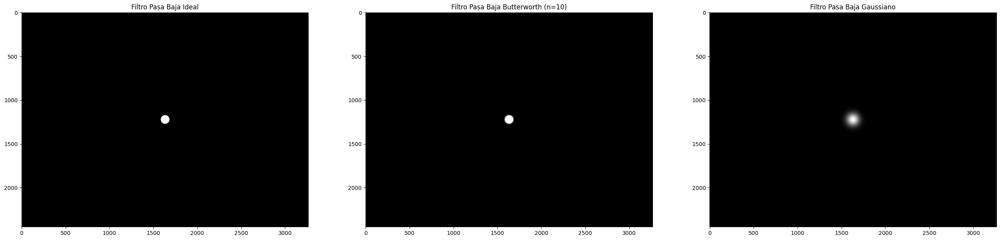

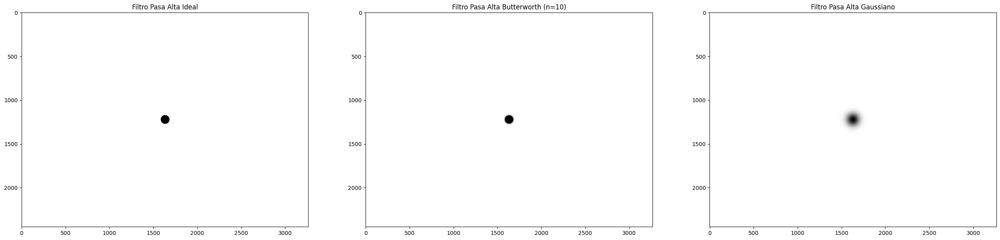

In [14]:
plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

IdealLP = idealFilterLP(50,img.shape)
plt.subplot(131), plt.imshow(IdealLP, "gray"), plt.title("Filtro Pasa Baja Ideal")

ButterLP = butterworthLP(50,img.shape,10)
plt.subplot(132), plt.imshow(ButterLP, "gray"), plt.title("Filtro Pasa Baja Butterworth (n=10)")

GaussianLP = gaussianLP(50,img.shape)
plt.subplot(133), plt.imshow(GaussianLP, "gray"), plt.title("Filtro Pasa Baja Gaussiano")

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)
IdealHP = idealFilterHP(50,img.shape)
plt.subplot(231), plt.imshow(IdealHP, "gray"), plt.title("Filtro Pasa Alta Ideal")

ButterHP = butterworthHP(50,img.shape,10)
plt.subplot(232), plt.imshow(ButterHP, "gray"), plt.title("Filtro Pasa Alta Butterworth (n=10)")

GaussianHP = gaussianHP(50,img.shape)
plt.subplot(233), plt.imshow(GaussianHP, "gray"), plt.title("Filtro Pasa Alta Gaussiano")

plt.show()

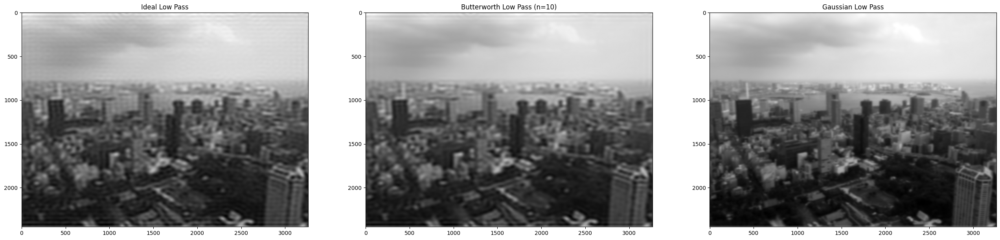

In [15]:
img = cv2.imread(image_path, 0)
original = np.fft.fft2(img)
center = np.fft.fftshift(original)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

LowPassCenter = center * idealFilterLP(50,img.shape)
LowPass = np.fft.ifftshift(LowPassCenter)
inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(131), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Ideal Low Pass")

LowPassCenter = center * butterworthLP(50,img.shape,10)
LowPass = np.fft.ifftshift(LowPassCenter)
inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(132), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Butterworth Low Pass (n=10)")

LowPassCenter = center * gaussianLP(50,img.shape)
LowPass = np.fft.ifftshift(LowPassCenter)
inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(133), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Gaussian Low Pass")

plt.show()

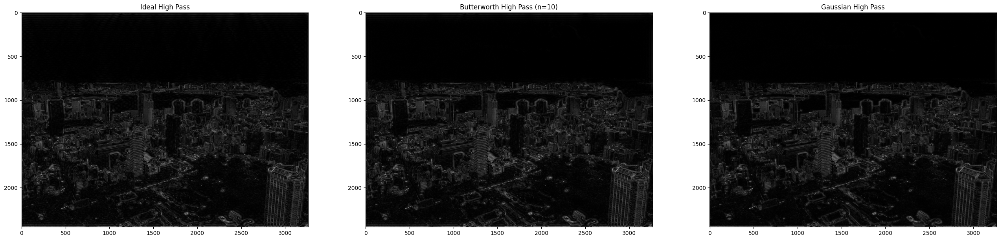

In [16]:
img = cv2.imread(image_path, 0)


original = np.fft.fft2(img)
center = np.fft.fftshift(original)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

HighPassCenter = center * idealFilterHP(50,img.shape)
HighPass = np.fft.ifftshift(HighPassCenter)
inverse_HighPass = np.fft.ifft2(HighPass)
plt.subplot(131), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Ideal High Pass")

HighPassCenter = center * butterworthHP(50,img.shape,10)
HighPass = np.fft.ifftshift(HighPassCenter)
inverse_HighPass = np.fft.ifft2(HighPass)
plt.subplot(132), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Butterworth High Pass (n=10)")

HighPassCenter = center * gaussianHP(50,img.shape)
HighPass = np.fft.ifftshift(HighPassCenter)
inverse_HighPass = np.fft.ifft2(HighPass)
plt.subplot(133), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Gaussian High Pass")

plt.show()

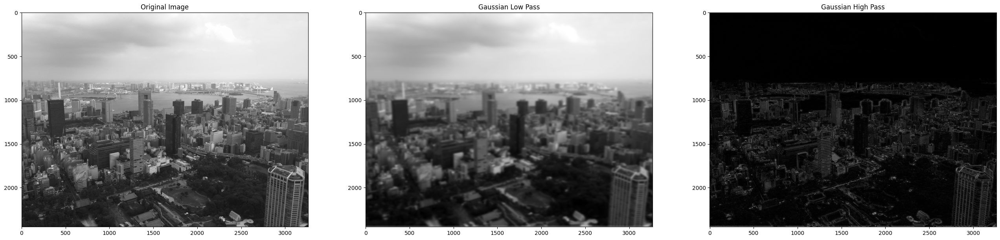

In [17]:
img = cv2.imread(image_path, 0)
original = np.fft.fft2(img)
center = np.fft.fftshift(original)

plt.figure(figsize=(6.4*5, 4.8*5), constrained_layout=False)

plt.subplot(131), plt.imshow(img, "gray"), plt.title("Original Image")

LowPassCenter = center * gaussianLP(50,img.shape)
LowPass = np.fft.ifftshift(LowPassCenter)
inverse_LowPass = np.fft.ifft2(LowPass)
plt.subplot(132), plt.imshow(np.abs(inverse_LowPass), "gray"), plt.title("Gaussian Low Pass")

HighPassCenter = center * gaussianHP(50,img.shape)
HighPass = np.fft.ifftshift(HighPassCenter)
inverse_HighPass = np.fft.ifft2(HighPass)
plt.subplot(133), plt.imshow(np.abs(inverse_HighPass), "gray"), plt.title("Gaussian High Pass")

plt.show()

<img src="https://iili.io/KId98Rp.png" alt="Imagen en alta resolución" width="2500"/>

Los ejercicios que deben realizarse a este proyecto son los siguientes:

 a) Investigar una aplicación de mejoramiento de imágenes usando transformada de Fourier usando filtro pasabajas. Realizar una demo sencilla en Google collab. De preferencia probar los tres tipo de filtros básicos (Ideal, el Butterworth y el Gaussian,)

b) Investigar una aplicación de mejoramiento de imágenes usando transformada de Fourier usando filtro pasa altas. Realizar una demo sencilla en Google collab. De preferencia probar los tres tipo de filtros básicos (Ideal, el Butterworth y el Gaussian,)

In [18]:
def load_image(path):
    img = cv2.imread(path, 0)
    return img

def fft_image(img):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    return fshift

def ifft_image(fshift):
    f_ishift = np.fft.ifftshift(fshift)
    img_back = np.fft.ifft2(f_ishift)
    return np.abs(img_back)

def ideal_lowpass(shape, cutoff):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols), np.uint8)
    for u in range(rows):
        for v in range(cols):
            if np.sqrt((u - crow)**2 + (v - ccol)**2) <= cutoff:
                mask[u, v] = 1
    return mask

def butterworth_lowpass(shape, cutoff, n):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols))
    for u in range(rows):
        for v in range(cols):
            D = np.sqrt((u - crow)**2 + (v - ccol)**2)
            mask[u, v] = 1 / (1 + (D / cutoff)**(2 * n))
    return mask

def gaussian_lowpass(shape, cutoff):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols))
    for u in range(rows):
        for v in range(cols):
            D = np.sqrt((u - crow)**2 + (v - ccol)**2)
            mask[u, v] = np.exp(-(D**2) / (2 * (cutoff**2)))
    return mask



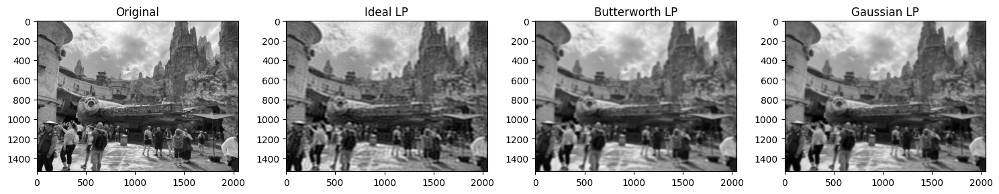

In [19]:
image_path = os.path.join(output_dir_original, "05 - Galaxy_edge.jpeg")

# Cargar imagen
img = load_image(image_path)

# Transformada de Fourier
fshift = fft_image(img)

# Filtros
cutoff = 50
ideal = ideal_lowpass(img.shape, cutoff)
butter = butterworth_lowpass(img.shape, cutoff, n=2)
gauss = gaussian_lowpass(img.shape, cutoff)

# Aplicar filtros
ideal_filtered = fshift * ideal
butter_filtered = fshift * butter
gauss_filtered = fshift * gauss

# Reconstrucción
img_ideal = ifft_image(ideal_filtered)
img_butter = ifft_image(butter_filtered)
img_gauss = ifft_image(gauss_filtered)

# Visualización
plt.figure(figsize=(15,5))
plt.subplot(141), plt.imshow(img, cmap='gray'), plt.title('Original')
plt.subplot(142), plt.imshow(img_ideal, cmap='gray'), plt.title('Ideal LP')
plt.subplot(143), plt.imshow(img_butter, cmap='gray'), plt.title('Butterworth LP')
plt.subplot(144), plt.imshow(img_gauss, cmap='gray'), plt.title('Gaussian LP')
plt.tight_layout()
plt.show()


In [20]:
def idealHP(shape, cutoff):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    mask = np.ones((rows, cols), np.uint8)
    for u in range(rows):
        for v in range(cols):
            if np.sqrt((u - crow)**2 + (v - ccol)**2) <= cutoff:
                mask[u, v] = 0
    return mask

def butterworthHP(shape, cutoff, n):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols))
    for u in range(rows):
        for v in range(cols):
            D = np.sqrt((u - crow)**2 + (v - ccol)**2)
            mask[u, v] = 1 / (1 + (cutoff / D)**(2 * n)) if D != 0 else 0
    return mask

def gaussianHP(shape, cutoff):
    rows, cols = shape
    crow, ccol = rows // 2, cols // 2
    mask = np.zeros((rows, cols))
    for u in range(rows):
        for v in range(cols):
            D = np.sqrt((u - crow)**2 + (v - ccol)**2)
            mask[u, v] = 1 - np.exp(-(D**2) / (2 * (cutoff**2)))
    return mask

def inverse_fft(fshift):
    return np.abs(np.fft.ifft2(np.fft.ifftshift(fshift)))

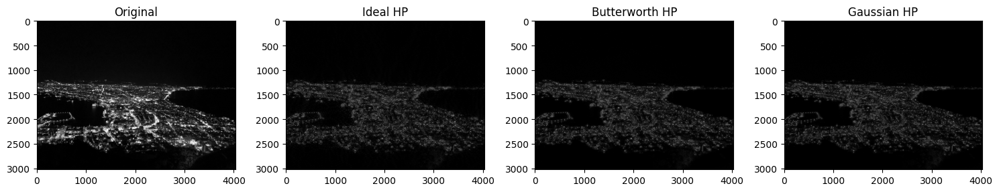

In [21]:
image_path = os.path.join(output_dir_original, "02 - Hokkaido.jpeg")

img = cv2.imread(image_path, 0)

# Transformada de Fourier
fshift = np.fft.fftshift(np.fft.fft2(img))


# Aplicar filtros
cutoff = 50
ideal = idealHP(img.shape, cutoff)
butter = butterworthHP(img.shape, cutoff, n=2)
gauss = gaussianHP(img.shape, cutoff)

# Filtrar en frecuencia
ideal_filtered = fshift * ideal
butter_filtered = fshift * butter
gauss_filtered = fshift * gauss

# Reconstrucción
img_ideal = inverse_fft(ideal_filtered)
img_butter = inverse_fft(butter_filtered)
img_gauss = inverse_fft(gauss_filtered)

# Visualización
plt.figure(figsize=(15,5))
plt.subplot(141), plt.imshow(img, cmap='gray'), plt.title('Original')
plt.subplot(142), plt.imshow(img_ideal, cmap='gray'), plt.title('Ideal HP')
plt.subplot(143), plt.imshow(img_butter, cmap='gray'), plt.title('Butterworth HP')
plt.subplot(144), plt.imshow(img_gauss, cmap='gray'), plt.title('Gaussian HP')
plt.tight_layout()
plt.show()


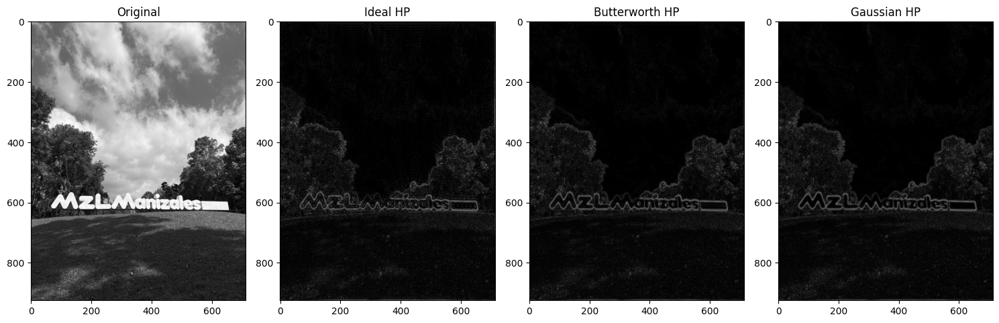

In [22]:
image_path = os.path.join(output_dir_original, "07 - Manizales.png")

img = cv2.imread(image_path, 0)

# Transformada de Fourier
fshift = np.fft.fftshift(np.fft.fft2(img))


# Aplicar filtros
cutoff = 50
ideal = idealHP(img.shape, cutoff)
butter = butterworthHP(img.shape, cutoff, n=2)
gauss = gaussianHP(img.shape, cutoff)

# Filtrar en frecuencia
ideal_filtered = fshift * ideal
butter_filtered = fshift * butter
gauss_filtered = fshift * gauss

# Reconstrucción
img_ideal = inverse_fft(ideal_filtered)
img_butter = inverse_fft(butter_filtered)
img_gauss = inverse_fft(gauss_filtered)

# Visualización
plt.figure(figsize=(15,5))
plt.subplot(141), plt.imshow(img, cmap='gray'), plt.title('Original')
plt.subplot(142), plt.imshow(img_ideal, cmap='gray'), plt.title('Ideal HP')
plt.subplot(143), plt.imshow(img_butter, cmap='gray'), plt.title('Butterworth HP')
plt.subplot(144), plt.imshow(img_gauss, cmap='gray'), plt.title('Gaussian HP')
plt.tight_layout()
plt.show()


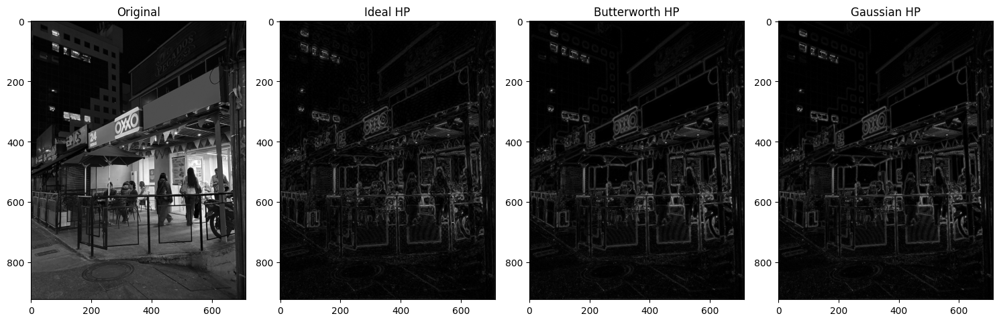

In [23]:
image_path = os.path.join(output_dir_original, "08 - OXXO.png")

img = cv2.imread(image_path, 0)

# Transformada de Fourier
fshift = np.fft.fftshift(np.fft.fft2(img))


# Aplicar filtros
cutoff = 50
ideal = idealHP(img.shape, cutoff)
butter = butterworthHP(img.shape, cutoff, n=2)
gauss = gaussianHP(img.shape, cutoff)

# Filtrar en frecuencia
ideal_filtered = fshift * ideal
butter_filtered = fshift * butter
gauss_filtered = fshift * gauss

# Reconstrucción
img_ideal = inverse_fft(ideal_filtered)
img_butter = inverse_fft(butter_filtered)
img_gauss = inverse_fft(gauss_filtered)

# Visualización
plt.figure(figsize=(15,5))
plt.subplot(141), plt.imshow(img, cmap='gray'), plt.title('Original')
plt.subplot(142), plt.imshow(img_ideal, cmap='gray'), plt.title('Ideal HP')
plt.subplot(143), plt.imshow(img_butter, cmap='gray'), plt.title('Butterworth HP')
plt.subplot(144), plt.imshow(img_gauss, cmap='gray'), plt.title('Gaussian HP')
plt.tight_layout()
plt.show()

In [ ]:
# ===============================================================
# TIEMPO TOTAL DE EJECUCIÓN
# ===============================================================
execution_time = time.time() - notebook_start_time
hours, remainder = divmod(int(execution_time), 3600)
minutes, seconds = divmod(remainder, 60)

print("\n" + "=" * 60)
print("⏱️  RESUMEN DE EJECUCIÓN")
print("=" * 60)
print(f"Tiempo total: {hours:02d}h {minutes:02d}m {seconds:02d}s ({execution_time:.2f} segundos)")
print(f"Imágenes procesadas: {len(imagenes_originales)}")
print(f"Finalizado: {datetime.now(ZoneInfo('America/Mexico_City')).strftime('%Y-%m-%d %H:%M:%S')}")
print("=" * 60)

In [24]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from google.colab import files # Import the Colab file module

# --- 1. Define the Hybrid Image Generation Function ---

def create_hybrid_image(image1_path, image2_path, low_pass_cutoff, high_pass_cutoff):
    """
    Generates a hybrid image by combining the low-frequency component of
    Image 1 and the high-frequency component of Image 2.
    """
    try:
        # Load images in grayscale and normalize to [0, 1]
        img1 = cv2.imread(image1_path, cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
        img2 = cv2.imread(image2_path, cv2.IMREAD_GRAYSCALE).astype(np.float32) / 255.0
    except Exception as e:
        print(f"Error loading images: {e}")
        return None, None, None

    # Ensure images have the same dimensions (crucial for element-wise addition)
    min_height = min(img1.shape[0], img2.shape[0])
    min_width = min(img1.shape[1], img2.shape[1])

    # Resize to the smallest common size
    img1 = cv2.resize(img1, (min_width, min_height))
    img2 = cv2.resize(img2, (min_width, min_height))

    # --- Low-Frequency Component (Image 1) ---
    # Apply Gaussian blur (Low-pass filter)
    # The (0, 0) specifies kernel size; sigma controls the blur amount
    low_freq_img1 = cv2.GaussianBlur(img1, (0, 0), low_pass_cutoff)

    # NEW STEP: Increase the contrast of the blurred image
    # --------------------------------------------------------------------
    # A contrast factor of 1.2 to 1.5 is usually a good starting point.
    CONTRAST_BOOST = 1.3
    low_freq_img1_boosted = low_freq_img1 * CONTRAST_BOOST
    # We need to clip the values back to 0-1 range after boosting
    low_freq_img1_boosted = np.clip(low_freq_img1_boosted, 0, 1)
    # --------------------------------------------------------------------


    # --- High-Frequency Component (Image 2) ---
    # 1. Blur Image 2 (to get its low-frequency part)
    blurred_img2 = cv2.GaussianBlur(img2, (0, 0), high_pass_cutoff)
    # 2. Subtract blurred image from original (High-pass filter)
    high_freq_img2 = img2 - blurred_img2

    # --- Combine ---
    hybrid_img = low_freq_img1_boosted + high_freq_img2

    # Normalize the hybrid image to be between 0 and 1 for display
    hybrid_img = np.clip(hybrid_img, 0, 1)

    return low_freq_img1, high_freq_img2, hybrid_img

# --- 2. Google Colab File Upload ---

# List of files you expect to upload (adjust these names)
IMAGE_FILE_1 = 'image_low_freq.jpg' # The image you want to see from far
IMAGE_FILE_2 = 'image_high_freq.jpg' # The image you want to see up close

print(f"Please upload two images: '{IMAGE_FILE_1}' and '{IMAGE_FILE_2}'")

# Check if both files were uploaded
if IMAGE_FILE_1 not in uploaded or IMAGE_FILE_2 not in uploaded:
    print("\n[ERROR] Both images were not uploaded. Please try again.")
else:
    # --- 3. Configuration and Execution ---

    # Adjust these sigma values to control the effect!
    # Larger sigma = more blurring / more detail removal
    # A good starting point is often between 5 and 10.
    LOW_PASS_SIGMA = 2  # Sigma for blurring image 1
    HIGH_PASS_SIGMA = 20 # Sigma for high-pass on image 2

    low_freq_only, high_freq_only, hybrid_image = create_hybrid_image(
        IMAGE_FILE_1, IMAGE_FILE_2, LOW_PASS_SIGMA, HIGH_PASS_SIGMA
    )

    # --- 4. Display Results ---
    if hybrid_image is not None:
        plt.figure(figsize=(15, 6))

        # Display Original Image 1 (Low-Freq)
        plt.subplot(1, 4, 1)
        original_img1 = cv2.imread(IMAGE_FILE_1, cv2.IMREAD_GRAYSCALE)
        plt.imshow(original_img1, cmap='gray')
        plt.title(f'Original 1\n(Far View: {IMAGE_FILE_1})')
        plt.axis('off')

        # Display Low Frequency Component of Image 1
        plt.subplot(1, 4, 2)
        plt.imshow(low_freq_only, cmap='gray')
        plt.title(f'Low Freq Only\n($\sigma_L$={LOW_PASS_SIGMA})')
        plt.axis('off')

        # Display High Frequency Component of Image 2
        plt.subplot(1, 4, 3)
        # Note: High frequency images often have a mean around 0, so they appear gray/dark.
        # Use a contrasting colormap (like seismic) to visualize high/low values,
        # or stick to gray to see the detail map.
        plt.imshow(high_freq_only, cmap='gray')
        plt.title(f'High Freq Only\n($\sigma_H$={HIGH_PASS_SIGMA})')
        plt.axis('off')

        # Display Final Hybrid Image
        plt.subplot(1, 4, 4)
        plt.imshow(hybrid_image, cmap='gray')
        plt.title('Final Hybrid Image')
        plt.axis('off')

        plt.tight_layout()
        plt.show()

Please upload two images: 'image_low_freq.jpg' and 'image_high_freq.jpg'


<>:96: SyntaxWarning: invalid escape sequence '\s'
<>:105: SyntaxWarning: invalid escape sequence '\s'
<>:96: SyntaxWarning: invalid escape sequence '\s'
<>:105: SyntaxWarning: invalid escape sequence '\s'
/tmp/ipython-input-787221990.py:96: SyntaxWarning: invalid escape sequence '\s'
  plt.title(f'Low Freq Only\n($\sigma_L$={LOW_PASS_SIGMA})')
/tmp/ipython-input-787221990.py:105: SyntaxWarning: invalid escape sequence '\s'
  plt.title(f'High Freq Only\n($\sigma_H$={HIGH_PASS_SIGMA})')


NameError: name 'uploaded' is not defined